# Setup

In [1]:
import scripts.loader as loader
import matplotlib
from holoviews import opts
import os
# os.environ['BOKEH_RESOURCES'] = 'inline'
%matplotlib inline
# %opts Image [width=1600 height=1000]
import numpy as np
from pylab import rcParams
from scripts.Deriv_dask import Deriv_dask
import scripts.latexify as latexify
from timeit import default_timer as timer
import sys

from bokeh.io import output_notebook
output_notebook()

/uni-mainz.de/homes/mahieron/.local/lib/python3.5/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.cluster.k_means_ module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.cluster. Anything that cannot be imported from sklearn.cluster is now part of the private API.
  warnings.warn(message, FutureWarning)
/uni-mainz.de/homes/mahieron/.local/lib/python3.5/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


Loading BokehJS ...

In [2]:
rcParams['figure.figsize'] = (16,10)
latexify.set_size(beamer=True)
kwargs = {"alpha": 0.3}
trajectories = None

In [3]:
out_params = ["qc", "S", "p"]
in_params_dic = {"Misc":
            ["da_1", "da_2", "de_1", "de_2", "dd", "dN_c", "dgamma",
            "dbeta_c", "dbeta_r", "ddelta1", "ddelta2", "dzeta",
            "drain_gfak", "dcloud_k_au", "dcloud_k_sc", "dkc_autocon",
            "dinv_z"],
            "Rain":
            ["drain_a_geo", "drain_b_geo", "drain_min_x", "drain_max_x",
            "drain_sc_theta_q", "drain_sc_delta_q", "drain_sc_theta_n",
            "drain_sc_delta_n", "drain_s_vel", "drain_a_vel", "drain_b_vel",
            "drain_rho_v", "drain_c_z", "drain_sc_coll_n", "drain_cmu0",
            "drain_cmu1", "drain_cmu2", "drain_cmu3", "drain_cmu4",
            "drain_cmu5", "drain_alpha", "drain_beta", "drain_gamma",
            "drain_nu", "drain_g1", "drain_g2", "drain_mu", "drain_nm1",
            "drain_nm2", "drain_nm3", "drain_q_crit_c", "drain_d_crit_c",
            "drain_ecoll_c", "drain_cap", "drain_a_ven", "drain_b_ven",
            "drain_c_s", "drain_a_f", "drain_b_f", "drain_alfa_n",
            "drain_alfa_q", "drain_lambda", "drain_vsedi_min",
            "drain_vsedi_max"],
            "Cloud":
            ["dcloud_a_geo", "dcloud_b_geo", "dcloud_min_x",
            "dcloud_max_x", "dcloud_sc_theta_q", "dcloud_sc_delta_q",
            "dcloud_sc_theta_n", "dcloud_sc_delta_n", "dcloud_s_vel",
            "dcloud_a_vel", "dcloud_b_vel", "dcloud_rho_v", "dcloud_c_z",
            "dcloud_sc_coll_n", "dcloud_cmu0", "dcloud_cmu1", "dcloud_cmu2",
            "dcloud_cmu3", "dcloud_cmu4", "dcloud_cmu5", "dcloud_alpha",
            "dcloud_beta", "dcloud_gamma", "dcloud_nu", "dcloud_g1",
            "dcloud_g2", "dcloud_mu", "dcloud_nm1", "dcloud_nm2",
            "dcloud_nm3", "dcloud_q_crit_c", "dcloud_d_crit_c",
            "dcloud_ecoll_c", "dcloud_cap", "dcloud_a_ven", "dcloud_b_ven",
            "dcloud_c_s", "dcloud_a_f", "dcloud_b_f", "dcloud_alfa_n",
            "dcloud_alfa_q", "dcloud_lambda", "dcloud_vsedi_min",
            "dcloud_vsedi_max"],
            "Graupel":
            ["dgraupel_a_geo", "dgraupel_b_geo", "dgraupel_min_x",
            "dgraupel_max_x", "dgraupel_sc_theta_q", "dgraupel_sc_delta_q",
            "dgraupel_sc_theta_n", "dgraupel_sc_delta_n", "dgraupel_s_vel",
            "dgraupel_a_vel", "dgraupel_b_vel", "dgraupel_rho_v",
            "dgraupel_c_z", "dgraupel_sc_coll_n", "dgraupel_cmu0",
            "dgraupel_cmu1", "dgraupel_cmu2", "dgraupel_cmu3", "dgraupel_cmu4",
            "dgraupel_cmu5", "dgraupel_alpha", "dgraupel_beta",
            "dgraupel_gamma", "dgraupel_nu", "dgraupel_g1", "dgraupel_g2",
            "dgraupel_mu", "dgraupel_nm1", "dgraupel_nm2", "dgraupel_nm3",
            "dgraupel_q_crit_c", "dgraupel_d_crit_c", "dgraupel_ecoll_c",
            "dgraupel_cap", "dgraupel_a_ven", "dgraupel_b_ven", "dgraupel_c_s",
            "dgraupel_a_f", "dgraupel_b_f", "dgraupel_alfa_n", "dgraupel_alfa_q",
            "dgraupel_lambda", "dgraupel_vsedi_min", "dgraupel_vsedi_max"],
            "Hail":
            ["dhail_a_geo", "dhail_b_geo", "dhail_min_x", "dhail_max_x",
            "dhail_sc_theta_q", "dhail_sc_delta_q", "dhail_sc_theta_n",
            "dhail_sc_delta_n", "dhail_s_vel", "dhail_a_vel", "dhail_b_vel",
            "dhail_rho_v", "dhail_c_z", "dhail_sc_coll_n", "dhail_cmu0",
            "dhail_cmu1", "dhail_cmu2", "dhail_cmu3", "dhail_cmu4",
            "dhail_cmu5", "dhail_alpha", "dhail_beta", "dhail_gamma",
            "dhail_nu", "dhail_g1", "dhail_g2", "dhail_mu", "dhail_nm1",
            "dhail_nm2", "dhail_nm3", "dhail_q_crit_c", "dhail_d_crit_c",
            "dhail_ecoll_c", "dhail_cap", "dhail_a_ven", "dhail_b_ven",
            "dhail_c_s", "dhail_a_f", "dhail_b_f", "dhail_alfa_n",
            "dhail_alfa_q", "dhail_lambda", "dhail_vsedi_min",
            "dhail_vsedi_max"],
            "Ice":
            ["dice_a_geo", "dice_b_geo", "dice_min_x", "dice_max_x",
            "dice_sc_theta_q", "dice_sc_delta_q", "dice_sc_theta_n",
            "dice_sc_delta_n", "dice_s_vel", "dice_a_vel", "dice_b_vel",
            "dice_rho_v", "dice_c_z", "dice_sc_coll_n", "dice_cmu0",
            "dice_cmu1", "dice_cmu2", "dice_cmu3", "dice_cmu4", "dice_cmu5",
            "dice_alpha", "dice_beta", "dice_gamma", "dice_nu", "dice_g1",
            "dice_g2", "dice_mu", "dice_nm1", "dice_nm2", "dice_nm3",
            "dice_q_crit_c", "dice_d_crit_c", "dice_ecoll_c", "dice_cap",
            "dice_a_ven", "dice_b_ven", "dice_c_s", "dice_a_f", "dice_b_f",
            "dice_alfa_n", "dice_alfa_q", "dice_lambda", "dice_vsedi_min",
            "dice_vsedi_max"],
            "Snow":
            ["dsnow_a_geo", "dsnow_b_geo", "dsnow_min_x", "dsnow_max_x",
            "dsnow_sc_theta_q", "dsnow_sc_delta_q", "dsnow_sc_theta_n",
            "dsnow_sc_delta_n", "dsnow_s_vel", "dsnow_a_vel", "dsnow_b_vel",
            "dsnow_rho_v", "dsnow_c_z", "dsnow_sc_coll_n", "dsnow_cmu0",
            "dsnow_cmu1", "dsnow_cmu2", "dsnow_cmu3", "dsnow_cmu4",
            "dsnow_cmu5", "dsnow_alpha", "dsnow_beta", "dsnow_gamma",
            "dsnow_nu", "dsnow_g1", "dsnow_g2", "dsnow_mu", "dsnow_nm1",
            "dsnow_nm2", "dsnow_nm3", "dsnow_q_crit_c", "dsnow_d_crit_c",
            "dsnow_ecoll_c", "dsnow_cap", "dsnow_a_ven", "dsnow_b_ven",
            "dsnow_c_s", "dsnow_a_f", "dsnow_b_f", "dsnow_alfa_n",
            "dsnow_alfa_q", "dsnow_lambda", "dsnow_vsedi_min",
            "dsnow_vsedi_max"]}


# Static Images using matplotlib as Backend

Plotting for Misc
Loading done in 16.420509193994803s
Got trajectories: 0      108
1      109
2      110
3      111
4      112
      ... 
157    265
158    266
159    267
160    268
161    269
Name: trajectory, Length: 162, dtype: int64
       timestep Output Parameter  trajectory  da_1  da_2  de_1  de_2  dd  \
index                                                                      
0           0.0                z         108   NaN   NaN   NaN   NaN NaN   
1           2.5                z         108   NaN   NaN   NaN   NaN NaN   
2           5.0                z         108   NaN   NaN   NaN   NaN NaN   
3           7.5                z         108   NaN   NaN   NaN   NaN NaN   
4          10.0                z         108   NaN   NaN   NaN   NaN NaN   

       dN_c  dgamma  ...  ddelta2  dzeta  drain_gfak  dcloud_k_au  \
index                ...                                            
0       NaN     NaN  ...      NaN    NaN         NaN          NaN   
1       NaN     NaN  ..

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

Creating 1 plots
Saving to pics/two_Misc_perc_p_qc_031.png


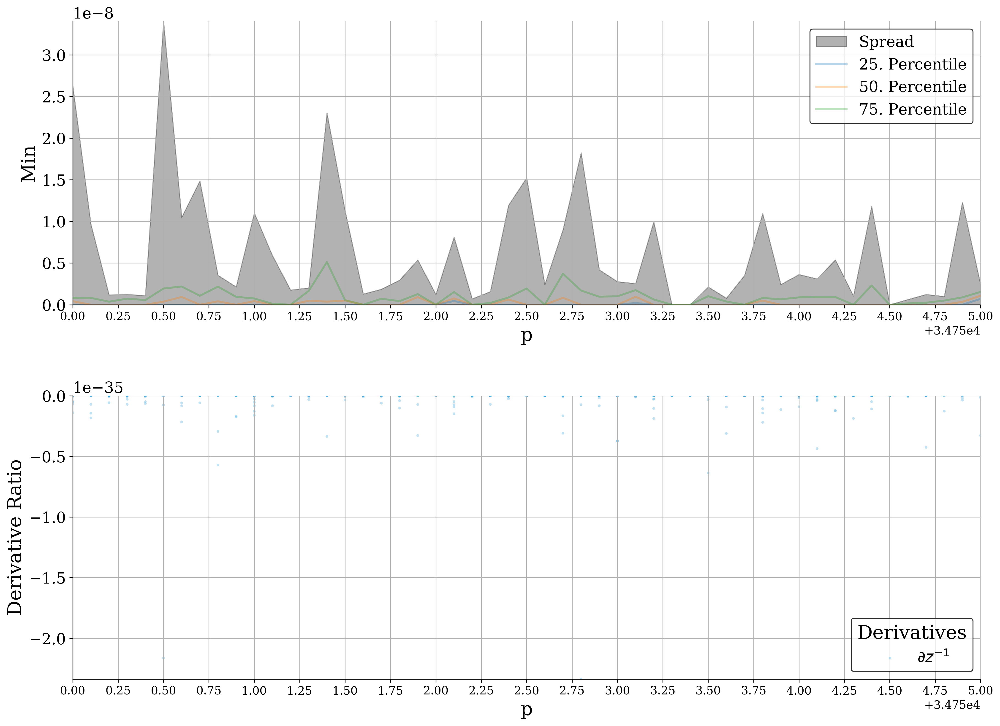

Saving done in 2.619777644998976s
Creating 1 plots
Saving to pics/two_Misc_perc_p_S_043.png


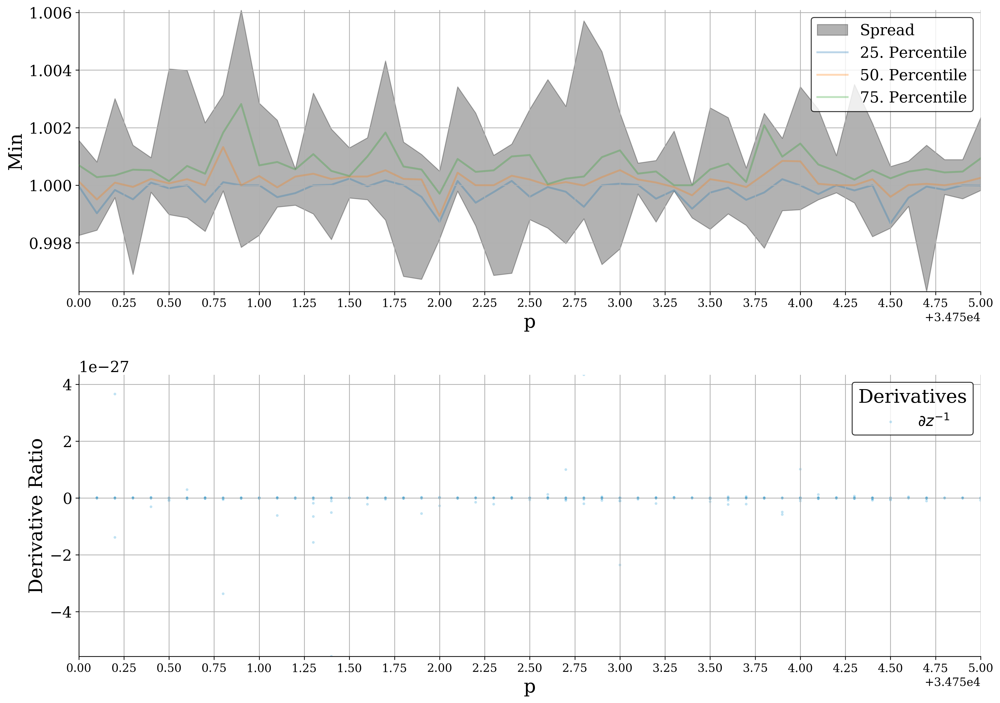

Saving done in 2.4400273490027757s
Creating 1 plots
x-axis and y-axis are the same. Cannot plot that with percentiles!
Plot two (p) done in 89.03318711499742s



In [4]:
for key in ["Misc"]:
    print("Plotting for {}".format(key))
    in_params = in_params_dic[key]
    direc_path = "/data/project/wcb/wcb_traj_flag_deriv_mult_min/parquet_concat"
    columns = ["timestep", "Output Parameter", "trajectory"] + in_params + out_params

    t = timer()
    data = Deriv_dask(
        direc=direc_path,
        parquet=True,
        columns=columns,
        backend="matplotlib"
    )
    t2 = timer()
    print("Loading done in {}s".format(t2-t))
    print("Got trajectories: {}".format(data.data["trajectory"].unique().compute()))
    print(data.data.head())
    
    t = timer()
    data.plot_two_ds(
        in_params=in_params,
        out_params=out_params,
        x_axis="p",
        mapped=False,
        trajectories=trajectories,
        scatter=False,
        frac=None,
        percentile=[25, 50, 75], 
        line_deriv=True,
        prefix=key + "_perc_",
        hist=False,
        n_plots=1,
        errorband=False,
        min_x=34750,
        max_x=34755,
        plot_path="pics/two_",
        **kwargs
    )
    t2 = timer()
    print("Plot two (p) done in {}s\n".format(t2-t))

Plotting for Misc
Loading done in 16.430079167010263s
Got trajectories: 0      108
1      109
2      110
3      111
4      112
      ... 
157    265
158    266
159    267
160    268
161    269
Name: trajectory, Length: 162, dtype: int64
       timestep Output Parameter  trajectory  da_1  da_2  de_1  de_2  dd  \
index                                                                      
0           0.0                z         108   NaN   NaN   NaN   NaN NaN   
1           2.5                z         108   NaN   NaN   NaN   NaN NaN   
2           5.0                z         108   NaN   NaN   NaN   NaN NaN   
3           7.5                z         108   NaN   NaN   NaN   NaN NaN   
4          10.0                z         108   NaN   NaN   NaN   NaN NaN   

       dN_c  dgamma  ...  ddelta2  dzeta  drain_gfak  dcloud_k_au  \
index                ...                                            
0       NaN     NaN  ...      NaN    NaN         NaN          NaN   
1       NaN     NaN  ..

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

Creating 1 plots
Saving to pics/hist_Misc_hist_p_qc_011.png


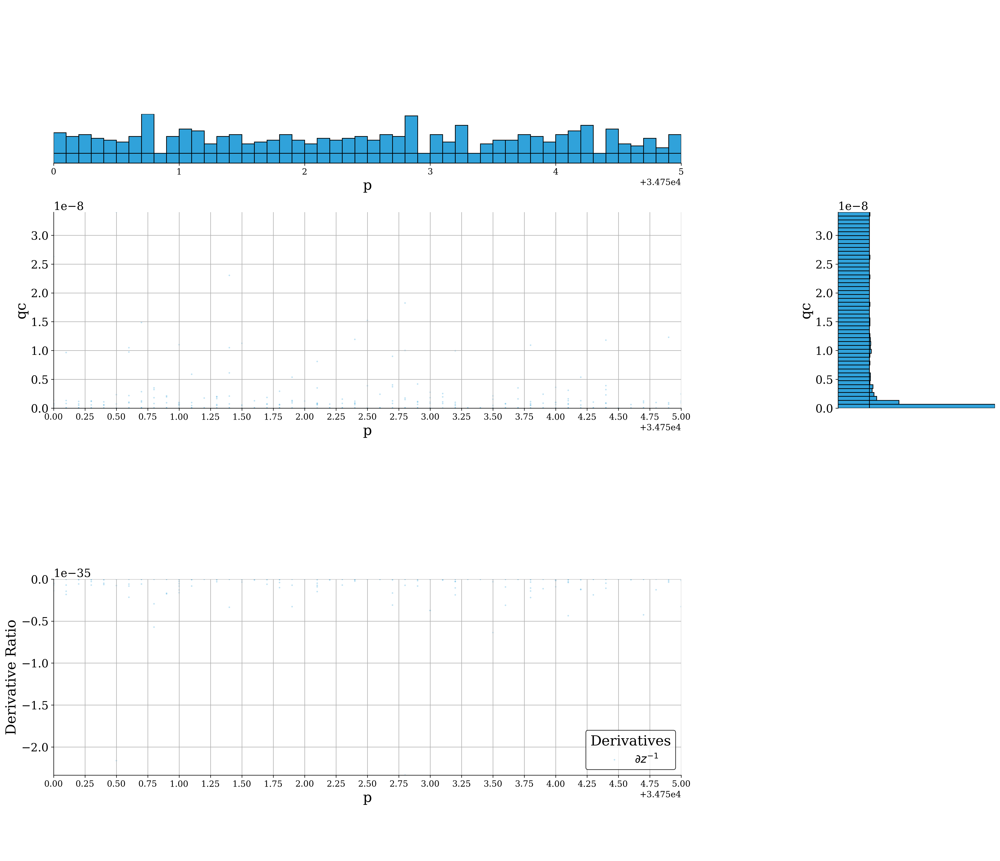

Saving done in 4.578236390996608s
Creating 1 plots
Saving to pics/hist_Misc_hist_p_S_009.png


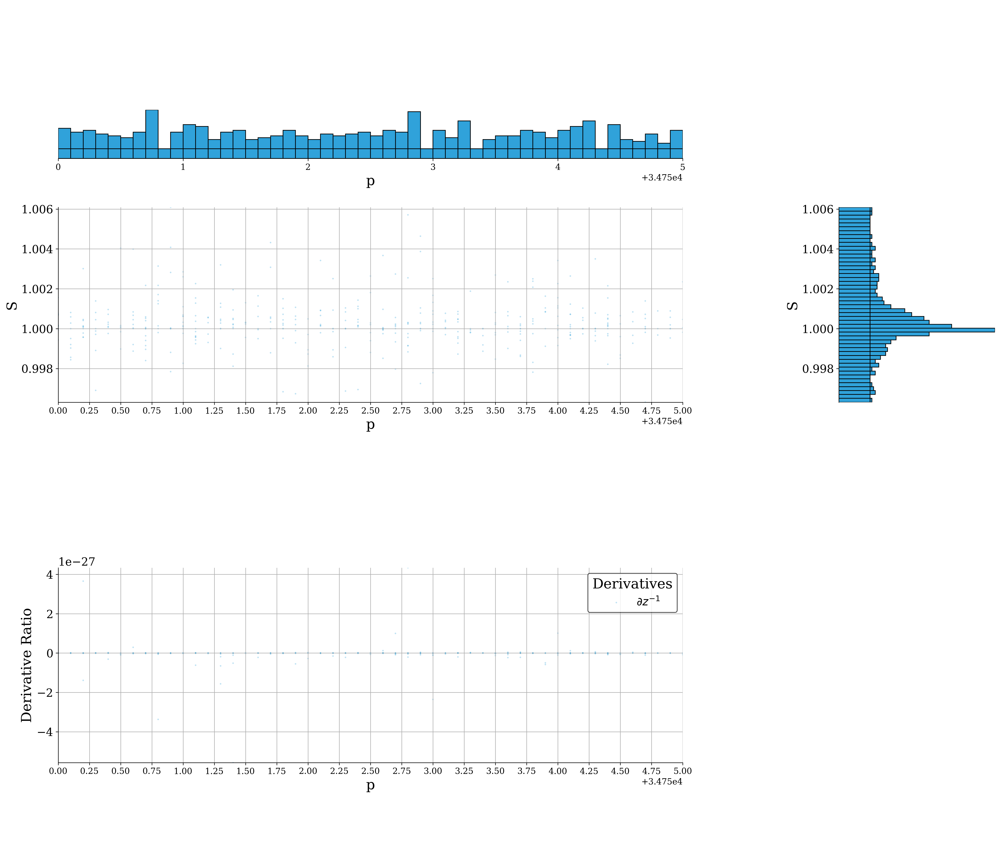

Saving done in 4.649325842008693s
Creating 1 plots
Saving to pics/hist_Misc_hist_p_p_005.png


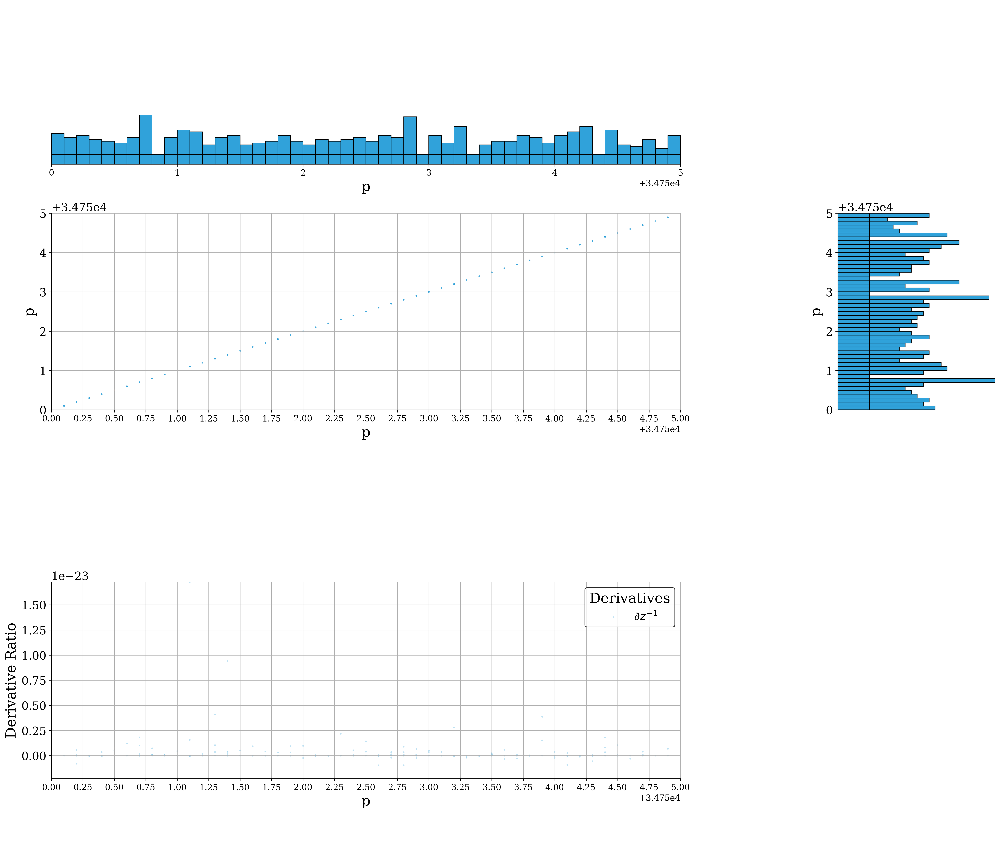

Saving done in 4.575498785998207s
Plot two (p) done in 97.42767466000805s



In [5]:
for key in ["Misc"]:
    print("Plotting for {}".format(key))
    in_params = in_params_dic[key]
    direc_path = "/data/project/wcb/wcb_traj_flag_deriv_mult_min/parquet_concat"
    columns = ["timestep", "Output Parameter", "trajectory"] + in_params + out_params

    t = timer()
    data = Deriv_dask(
        direc=direc_path,
        parquet=True,
        columns=columns,
        backend="matplotlib"
    )
    t2 = timer()
    print("Loading done in {}s".format(t2-t))
    print("Got trajectories: {}".format(data.data["trajectory"].unique().compute()))
    print(data.data.head())
    
    t = timer()
    data.plot_two_ds(
        in_params=in_params,
        out_params=out_params,
        x_axis="p",
        mapped=False,
        trajectories=trajectories,
        scatter=False,
        n_plots=1,
        frac=None,
        percentile=None, 
        line_deriv=True,
        prefix=key + "_hist_",
        hist=True,
        errorband=False,
        min_x=34750,
        max_x=34755,
        plot_path="pics/hist_",
        **kwargs
    )
    t2 = timer()
    print("Plot two (p) done in {}s\n".format(t2-t))

# Interactive Plots using bokeh as Backend

In [1]:
#### Using bokeh

Plotting for Misc
Loading done in 16.60272695599997s
Got trajectories: 0      108
1      109
2      110
3      111
4      112
      ... 
157    265
158    266
159    267
160    268
161    269
Name: trajectory, Length: 162, dtype: int64
       timestep Output Parameter  trajectory  da_1  da_2  de_1  de_2  dd  \
index                                                                      
0           0.0                z         108   NaN   NaN   NaN   NaN NaN   
1           2.5                z         108   NaN   NaN   NaN   NaN NaN   
2           5.0                z         108   NaN   NaN   NaN   NaN NaN   
3           7.5                z         108   NaN   NaN   NaN   NaN NaN   
4          10.0                z         108   NaN   NaN   NaN   NaN NaN   

       dN_c  dgamma  ...  ddelta2  dzeta  drain_gfak  dcloud_k_au  \
index                ...                                            
0       NaN     NaN  ...      NaN    NaN         NaN          NaN   
1       NaN     NaN  ...

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
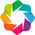

Creating 1 plots
opts: {}
scatter: {'alpha': 0.3, 'size': 5}
Plotting


Plotting done in 0.42230068299977574s
Creating 1 plots
opts: {}
scatter: {'alpha': 0.3, 'size': 5}
Plotting


Plotting done in 0.41947123099816963s
Creating 1 plots
opts: {}
scatter: {'alpha': 0.3, 'size': 5}
Plotting


Plotting done in 0.5510403310036054s
Plot two (p) done in 86.02862683900457s



In [4]:
for key in ["Misc"]:
    print("Plotting for {}".format(key))
    in_params = in_params_dic[key]
    direc_path = "/data/project/wcb/wcb_traj_flag_deriv_mult_min/parquet_concat"
    columns = ["timestep", "Output Parameter", "trajectory"] + in_params + out_params

    t = timer()
    data = Deriv_dask(
        direc=direc_path,
        parquet=True,
        columns=columns,
        backend="bokeh"
    )
    t2 = timer()
    print("Loading done in {}s".format(t2-t))
    print("Got trajectories: {}".format(data.data["trajectory"].unique().compute()))
    print(data.data.head())
    
    t = timer()
    data.plot_two_ds(
        in_params=in_params,
        out_params=out_params,
        x_axis="p",
        mapped=False,
        trajectories=trajectories,
        scatter=False,
        n_plots=1,
        frac=None,
        percentile=None, 
        line_deriv=True,
        prefix=key + "_hist_",
        hist=True,
        errorband=False,
        min_x=34750,
        max_x=34755,
        plot_path="pics/hist_",
        **kwargs
    )
    t2 = timer()
    print("Plot two (p) done in {}s\n".format(t2-t))

Plotting for Misc
Loading done in 16.70471804999397s
Got trajectories: 0      108
1      109
2      110
3      111
4      112
      ... 
157    265
158    266
159    267
160    268
161    269
Name: trajectory, Length: 162, dtype: int64
       timestep Output Parameter  trajectory  da_1  da_2  de_1  de_2  dd  \
index                                                                      
0           0.0                z         108   NaN   NaN   NaN   NaN NaN   
1           2.5                z         108   NaN   NaN   NaN   NaN NaN   
2           5.0                z         108   NaN   NaN   NaN   NaN NaN   
3           7.5                z         108   NaN   NaN   NaN   NaN NaN   
4          10.0                z         108   NaN   NaN   NaN   NaN NaN   

       dN_c  dgamma  ...  ddelta2  dzeta  drain_gfak  dcloud_k_au  \
index                ...                                            
0       NaN     NaN  ...      NaN    NaN         NaN          NaN   
1       NaN     NaN  ...

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
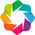

Creating 1 plots
Plotting


Plotting done in 0.48349595098989084s
Creating 1 plots
Plotting


Plotting done in 0.47730631998274475s
Creating 1 plots
x-axis and y-axis are the same. Cannot plot that with percentiles!
Plot two (p) done in 85.77124219399411s



In [5]:
for key in ["Misc"]:
    print("Plotting for {}".format(key))
    in_params = in_params_dic[key]
    direc_path = "/data/project/wcb/wcb_traj_flag_deriv_mult_min/parquet_concat"
    columns = ["timestep", "Output Parameter", "trajectory"] + in_params + out_params

    t = timer()
    data = Deriv_dask(
        direc=direc_path,
        parquet=True,
        columns=columns,
        backend="bokeh"
    )
    t2 = timer()
    print("Loading done in {}s".format(t2-t))
    print("Got trajectories: {}".format(data.data["trajectory"].unique().compute()))
    print(data.data.head())
    
    t = timer()
    data.plot_two_ds(
        in_params=in_params,
        out_params=out_params,
        x_axis="p",
        mapped=False,
        trajectories=trajectories,
        scatter=False,
        frac=None,
        percentile=[25, 50, 75],
        line_deriv=True,
        prefix=key + "_perc_",
        hist=False,
        n_plots=1,
        errorband=False,
        min_x=34750,
        max_x=34755,
        plot_path="pics/two_",
        **kwargs
    )
    t2 = timer()
    print("Plot two (p) done in {}s\n".format(t2-t))